In [63]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/engineering-placements-prediction/collegePlace.csv


In [64]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore", category = FutureWarning)

In [65]:
data = pd.read_csv('/kaggle/input/engineering-placements-prediction/collegePlace.csv')

In [66]:
data.head()

,Age,Gender,Stream,Internships,CGPA,Hostel,HistoryOfBacklogs,PlacedOrNot
0,22,Male,Electronics And Communication,1,8,1,1,1
1,21,Female,Computer Science,0,7,1,1,1
2,22,Female,Information Technology,1,6,0,0,1
3,21,Male,Information Technology,0,8,0,1,1
4,22,Male,Mechanical,0,8,1,0,1


In [67]:
data.shape

(2966, 8)

In [68]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2966 entries, 0 to 2965
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Age                2966 non-null   int64 
 1   Gender             2966 non-null   object
 2   Stream             2966 non-null   object
 3   Internships        2966 non-null   int64 
 4   CGPA               2966 non-null   int64 
 5   Hostel             2966 non-null   int64 
 6   HistoryOfBacklogs  2966 non-null   int64 
 7   PlacedOrNot        2966 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 185.5+ KB


In [69]:
data.describe().T.style.bar(subset=['mean'], color='green').background_gradient(subset=['std'], cmap='Blues')

,count,mean,std,min,25%,50%,75%,max
Age,2966.000000,21.485840,1.324933,19.000000,21.000000,21.000000,22.000000,30.000000
Internships,2966.000000,0.703641,0.740197,0.000000,0.000000,1.000000,1.000000,3.000000
CGPA,2966.000000,7.073837,0.967748,5.000000,6.000000,7.000000,8.000000,9.000000
Hostel,2966.000000,0.269049,0.443540,0.000000,0.000000,0.000000,1.000000,1.000000
HistoryOfBacklogs,2966.000000,0.192178,0.394079,0.000000,0.000000,0.000000,0.000000,1.000000
PlacedOrNot,2966.000000,0.552596,0.497310,0.000000,0.000000,1.000000,1.000000,1.000000


In [70]:
data.isnull().sum()

Age                  0
Gender               0
Stream               0
Internships          0
CGPA                 0
Hostel               0
HistoryOfBacklogs    0
PlacedOrNot          0
dtype: int64

In [71]:
data[data.duplicated()].shape

(1829, 8)

Text(23.634423465947407, 1024.38, 'Mean: 21.49')

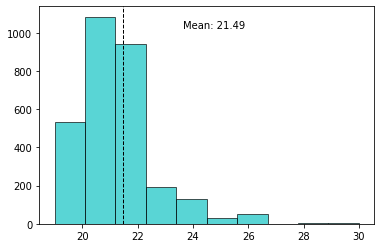

In [72]:
plt.hist( data['Age'], color='c', edgecolor='k', alpha=0.65)
plt.axvline(data['Age'].mean(), color='k', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(data['Age'].mean()*1.1, max_ylim*0.9, 'Mean: {:.2f}'.format(data['Age'].mean()))

Text(7.781220498988537, 903.42, 'Mean: 7.07')

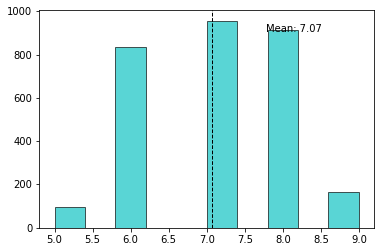

In [73]:
plt.hist( data['CGPA'], color='c', edgecolor='k', alpha=0.65)
plt.axvline(data['CGPA'].mean(), color='k', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(data['CGPA'].mean()*1.1, max_ylim*0.9, 'Mean: {:.2f}'.format(data['CGPA'].mean()))

In [74]:
fig = plt.figure(figsize=(18,10), dpi=1600)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((3,3),(0,0))
plt.pie(data.Gender.value_counts().values,labels=data.Gender.value_counts().index,autopct='%1.1f%%')
plt.title('Gender Distribution')

#first row sec column
ax1 = plt.subplot2grid((3,3), (0, 1))
plt.pie(data.Stream.value_counts().values,labels=data.Stream.value_counts().index,autopct='%1.1f%%')
plt.title('Streams')

#Second row first column
ax1 = plt.subplot2grid((3,3), (1, 0))
plt.pie(data.Internships.value_counts().values,labels=data.Internships.value_counts().index,autopct='%1.1f%%')
plt.title('Internships')

#second row second column
ax1 = plt.subplot2grid((3,3), (1, 1))
plt.pie(data.Hostel.value_counts().values,labels=data.Hostel.value_counts().index,autopct='%1.1f%%')
plt.title('Hostel')

#second row second column
ax1 = plt.subplot2grid((3,3), (2, 0))
plt.pie(data.HistoryOfBacklogs.value_counts().values,labels=data.HistoryOfBacklogs.value_counts().index,autopct='%1.1f%%')
plt.title('History Of Backlogs')

#second row second column
ax1 = plt.subplot2grid((3,3), (2, 1))
plt.pie(data.PlacedOrNot.value_counts().values,labels=data.PlacedOrNot.value_counts().index,autopct='%1.1f%%')
plt.title('Placed Or Not')

Text(0.5, 1.0, 'Placed Or Not')

In [75]:
male =data[data['Gender'] == "Male"]
total_male_placed = male[male['PlacedOrNot'] == 1].shape[0]
pass_male_percentage = np.round((total_male_placed * 100) / male.shape[0],2)
print(f'percentage of males placed out of total placed students is {pass_male_percentage} & for females is {100-pass_male_percentage}')


percentage of males placed out of total placed students is 55.11 & for females is 44.89


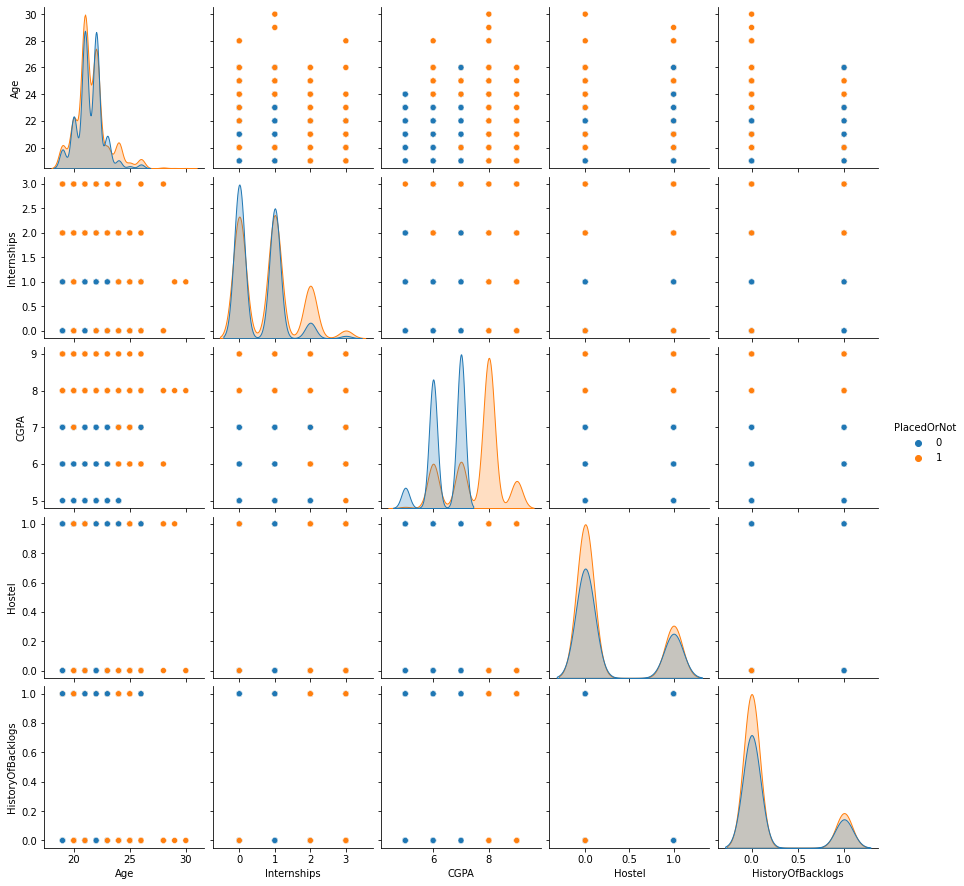

In [76]:
sns.pairplot(data,hue="PlacedOrNot")

In [77]:
fig = plt.figure(figsize=(18,8), dpi=2000)
#2 rows 2 columns

#first row, first column
ax1 = plt.subplot2grid((2,2),(0,0))
sns.histplot(data=data,x="Age",bins= 10, kde=True,hue="PlacedOrNot",multiple="stack")
plt.title('Age')

#first row sec column
ax1 = plt.subplot2grid((2,2), (0, 1))
sns.countplot(data=data,x="Hostel",hue="PlacedOrNot")
plt.title('Hostel')

Text(0.5, 1.0, 'Hostel')

In [78]:
fig = plt.figure(figsize=(18,8), dpi=2000)
#Second row first column
ax1 = plt.subplot2grid((2,2), (0, 0))
sns.countplot(data=data,x="Stream",hue="PlacedOrNot")
plt.xticks(rotation=45)
plt.title('Stream')

#second row second column
ax1 = plt.subplot2grid((2,2), (0, 1))
sns.countplot(data= data,x="Internships",hue="PlacedOrNot")
plt.title('Internships')

Text(0.5, 1.0, 'Internships')

In [79]:
fig = plt.figure(figsize=(18,8), dpi=2000)
#third row first column
ax1 = plt.subplot2grid((2,2), (0, 0))
sns.histplot(data=data,x="CGPA", kde=True,hue="PlacedOrNot",multiple="stack")
plt.title('CGPA')

#third row second column
ax1 = plt.subplot2grid((2,2), (0, 1))
sns.countplot(data=data,x="Hostel",hue="PlacedOrNot")
plt.title('Hostel')



Text(0.5, 1.0, 'Hostel')

Text(0.5, 1.0, 'History of Backlogs')

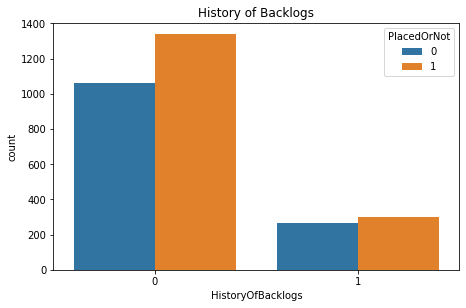

In [80]:
fig = plt.figure(figsize=(16,10))
ax1 = plt.subplot2grid((2,2), (0, 1))
sns.countplot(data=data,x="HistoryOfBacklogs",hue="PlacedOrNot")
plt.title('History of Backlogs')

In [81]:
!pip install pycaret
from pycaret.regression import *

from sklearn.preprocessing import LabelEncoder
import category_encoders as ce
def one_hot_encoding(df,col):
    one_hot_encoder=ce.OneHotEncoder(cols=col,return_df=True,use_cat_names=True)
    df_final = one_hot_encoder.fit_transform(df)
    return df_final
def one_hot(df, column):
    df = one_hot_encoding(df,column)
    return df

In [82]:
data = one_hot(data, 'Stream')
data = one_hot(data, 'Gender')


In [83]:
data.head()

,Age,Gender_Male,Gender_Female,Stream_Electronics And Communication,Stream_Computer Science,Stream_Information Technology,Stream_Mechanical,Stream_Electrical,Stream_Civil,Internships,CGPA,Hostel,HistoryOfBacklogs,PlacedOrNot
0,22,1,0,1,0,0,0,0,0,1,8,1,1,1
1,21,0,1,0,1,0,0,0,0,0,7,1,1,1
2,22,0,1,0,0,1,0,0,0,1,6,0,0,1
3,21,1,0,0,0,1,0,0,0,0,8,0,1,1
4,22,1,0,0,0,0,1,0,0,0,8,1,0,1


In [84]:
X = data.drop(['PlacedOrNot'],axis=1)
y = data['PlacedOrNot']

In [85]:
PlacedOrNot = data['PlacedOrNot']


In [86]:
env = setup(data= data,target='PlacedOrNot',train_size=0.99,normalize=True,normalize_method='robust',session_id = 69,silent=True)

,Description,Value
0,session_id,69
1,Target,PlacedOrNot
2,Original Data,"(2966, 14)"
3,Missing Values,False
4,Numeric Features,0
5,Categorical Features,13
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(2936, 29)"


In [87]:
model = compare_models(sort='R2')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.1737,0.0881,0.2963,0.6423,0.2086,0.1592,0.1600
catboost,CatBoost Regressor,0.1766,0.0889,0.2975,0.6393,0.2087,0.1676,1.2500
gbr,Gradient Boosting Regressor,0.2073,0.0926,0.3040,0.6240,0.2133,0.1959,0.0920
rf,Random Forest Regressor,0.1601,0.0929,0.3042,0.6229,0.2159,0.1423,0.3790
xgboost,Extreme Gradient Boosting,0.1728,0.0956,0.3086,0.6118,0.2149,0.1610,25.5050
et,Extra Trees Regressor,0.1521,0.1012,0.3175,0.5894,0.2243,0.1381,0.3750
dt,Decision Tree Regressor,0.1506,0.1018,0.3185,0.5869,0.2245,0.1383,0.0140
br,Bayesian Ridge,0.2564,0.1111,0.3330,0.5490,0.2306,0.2602,0.0140
ridge,Ridge Regression,0.2560,0.1111,0.3330,0.5488,0.2305,0.2601,0.0150
lar,Least Angle Regression,0.2558,0.1112,0.3331,0.5485,0.2305,0.2601,0.0150


In [88]:
tuned_model = tune_model(model,fold=10,optimize='RMSE',early_stopping=True,early_stopping_max_iters=10,choose_better = True)
final_model = finalize_model(tuned_model)


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,0.2583,0.1139,0.3375,0.5395,0.2362,0.2483
1,0.2415,0.1094,0.3308,0.5540,0.2313,0.2270
2,0.2472,0.1117,0.3342,0.5471,0.2346,0.2329
3,0.2336,0.0984,0.3137,0.6023,0.2255,0.1949
4,0.2337,0.1023,0.3198,0.5833,0.2283,0.1985
5,0.2477,0.1077,0.3281,0.5674,0.2359,0.2121
6,0.2453,0.0991,0.3149,0.6030,0.2272,0.2188
7,0.2624,0.1231,0.3508,0.4910,0.2417,0.2590
8,0.2155,0.0909,0.3016,0.6239,0.2131,0.1878
9,0.2400,0.0991,0.3148,0.6031,0.2284,0.2034


In [89]:
print(final_model)

LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=69, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [90]:
col_drop = data_1.iloc[:1]

In [91]:
import lightgbm as lgb

In [92]:
data

,Age,Gender_Male,Gender_Female,Stream_Electronics And Communication,Stream_Computer Science,Stream_Information Technology,Stream_Mechanical,Stream_Electrical,Stream_Civil,Internships,CGPA,Hostel,HistoryOfBacklogs,PlacedOrNot
0,22,1,0,1,0,0,0,0,0,1,8,1,1,1
1,21,0,1,0,1,0,0,0,0,0,7,1,1,1
2,22,0,1,0,0,1,0,0,0,1,6,0,0,1
3,21,1,0,0,0,1,0,0,0,0,8,0,1,1
4,22,1,0,0,0,0,1,0,0,0,8,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2961,23,1,0,0,0,1,0,0,0,0,7,0,0,0
2962,23,1,0,0,0,0,1,0,0,1,7,1,0,0
2963,22,1,0,0,0,1,0,0,0,1,7,0,0,0
2964,22,1,0,0,1,0,0,0,0,1,7,0,0,0


In [93]:
y_train = data.PlacedOrNot
data.drop(['PlacedOrNot'],axis=1,inplace=True)
lgbm = lgb.LGBMClassifier(boosting_type='gbdt',class_weight=None,learning_rate=0.1, max_depth=-1,min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, silent=True)
lgbm.fit(data_1,y_train)
pred = lgbm.predict(col_drop)


[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_coef_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_intercept_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute average_coef_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute average_intercept_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_coef_ was dep


[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will 

/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_coef_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_intercept_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute average_coef_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute average_intercept_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_coef_ was dep


[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6


/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_coef_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_intercept_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute average_coef_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute average_intercept_ was deprecated in version 0.23 and will be removed in 0.25.
  warnings.warn(msg, category=FutureWarning)
/opt/conda/lib/python3.7/site-packages/sklearn/utils/deprecation.py:101: FutureWarning: Attribute standard_coef_ was dep


[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] bagging_fraction is set=0.6, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will 

In [94]:
print(f'Predicted Deaths: {int(pred[0])}')
print(f'Actual Casuality caused: {PlacedOrNot.values[0]}')

Predicted Deaths: 1
Actual Casuality caused: 1
